<a href="https://colab.research.google.com/github/ShoheiHorikawa/gekkan-johkaso-2411/blob/main/gekkan_johkaso_2411.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 共通パート
以下は一番最初に実行してください。  
[Shift] + [Enter]  
で実行できます。

In [1]:
!git clone https://github.com/ShoheiHorikawa/gekkan-johkaso-2411.git
%cd gekkan-johkaso-2411
!pip install -r requirements.txt -q

Cloning into 'gekkan-johkaso-2411'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 33 (delta 7), reused 20 (delta 2), pack-reused 0 (from 0)
Receiving objects: 100% (33/33), 8.41 MiB | 18.47 MiB/s, done.
Resolving deltas: 100% (7/7), done.
/content/gekkan-johkaso-2411
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.1/871.1 kB 7.5 MB/s eta 0:00:00


# YOLO 事前学習モデルの確認
事前学習モデルで浄化槽のバルブが検出できるか確認します。

100%|██████████| 6.25M/6.25M [00:00<00:00, 76.5MB/s]



image 1/1 /content/gekkan-johkaso-2411/img/JO-5-2.jpg: 480x640 (no detections), 344.2ms
Speed: 18.2ms preprocess, 344.2ms inference, 14.4ms postprocess per image at shape (1, 3, 480, 640)
Processed JO-5-2.jpg and saved to ./predict-images01/JO-5-2.jpg


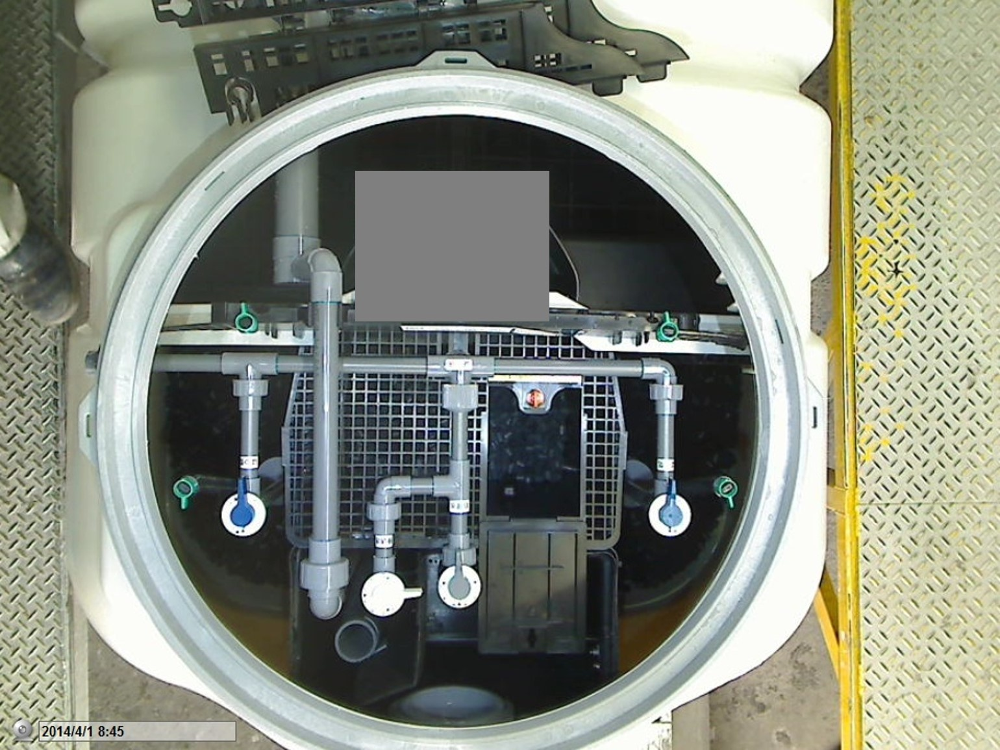


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-7-2.jpg: 480x640 (no detections), 216.6ms
Speed: 5.2ms preprocess, 216.6ms inference, 5.4ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-7-2.jpg and saved to ./predict-images01/NEXT-7-2.jpg


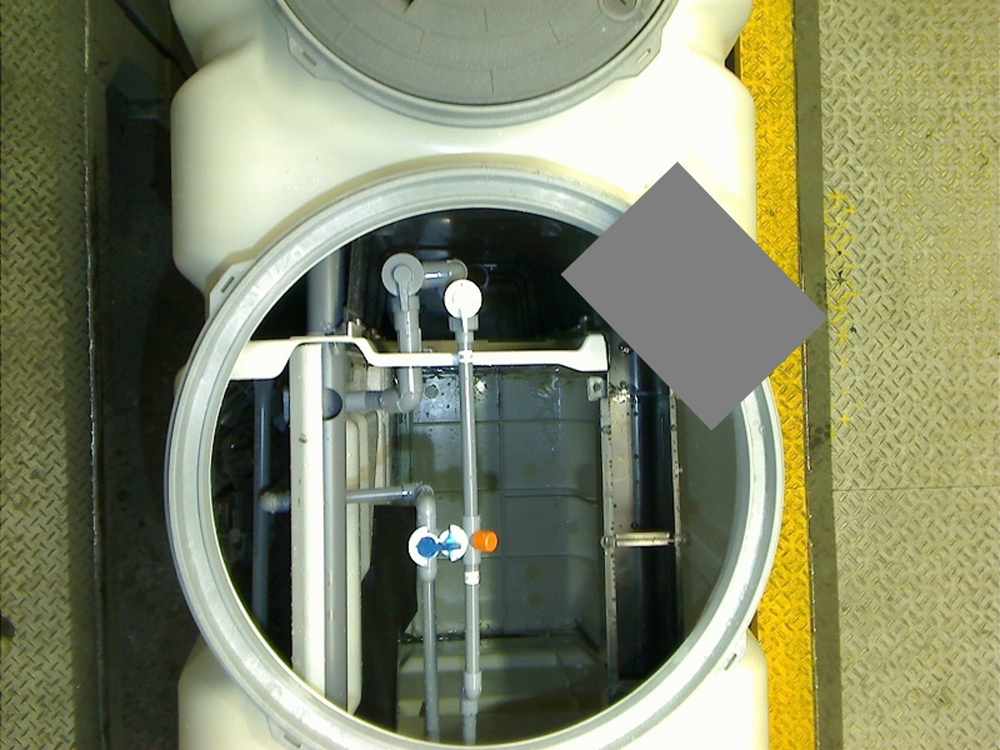


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-5-2.jpg: 480x640 1 truck, 264.7ms
Speed: 5.0ms preprocess, 264.7ms inference, 12.4ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-5-2.jpg and saved to ./predict-images01/NEXT-5-2.jpg


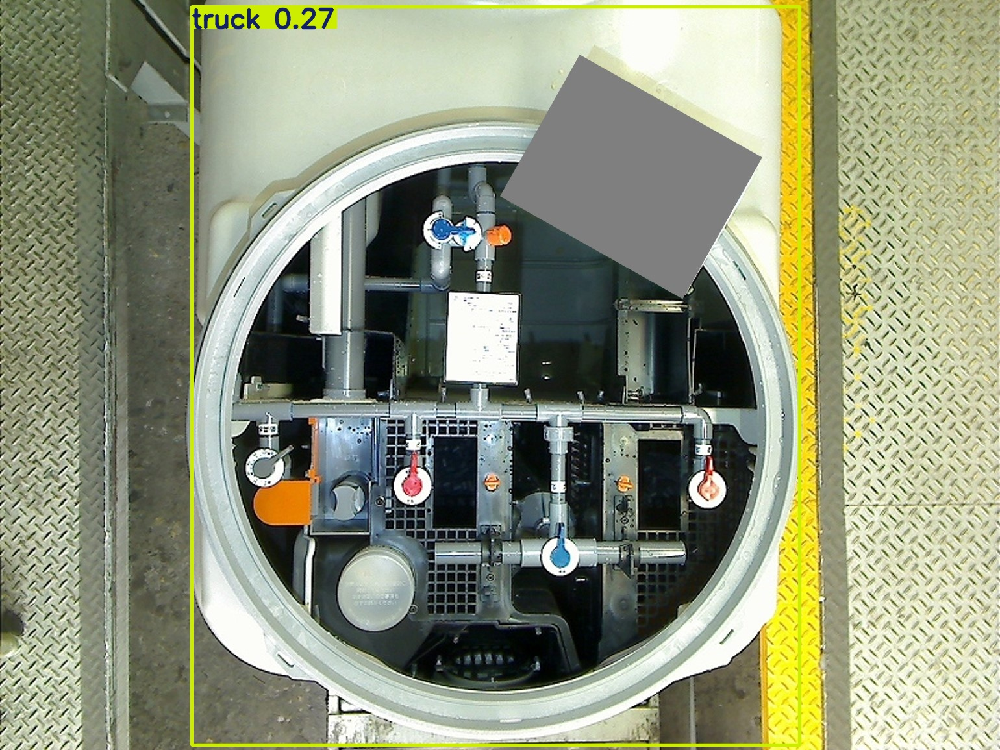


image 1/1 /content/gekkan-johkaso-2411/img/MO5-2.jpg: 480x640 (no detections), 261.3ms
Speed: 6.3ms preprocess, 261.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
Processed MO5-2.jpg and saved to ./predict-images01/MO5-2.jpg


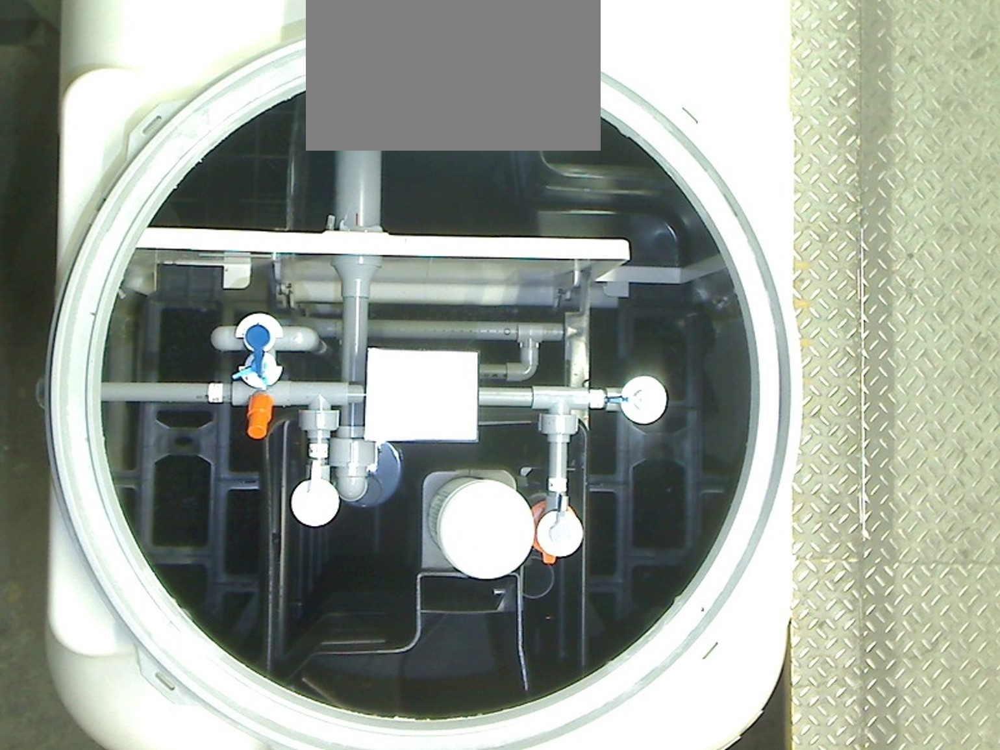


image 1/1 /content/gekkan-johkaso-2411/img/MO-7-3.jpg: 480x640 (no detections), 254.3ms
Speed: 5.5ms preprocess, 254.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
Processed MO-7-3.jpg and saved to ./predict-images01/MO-7-3.jpg


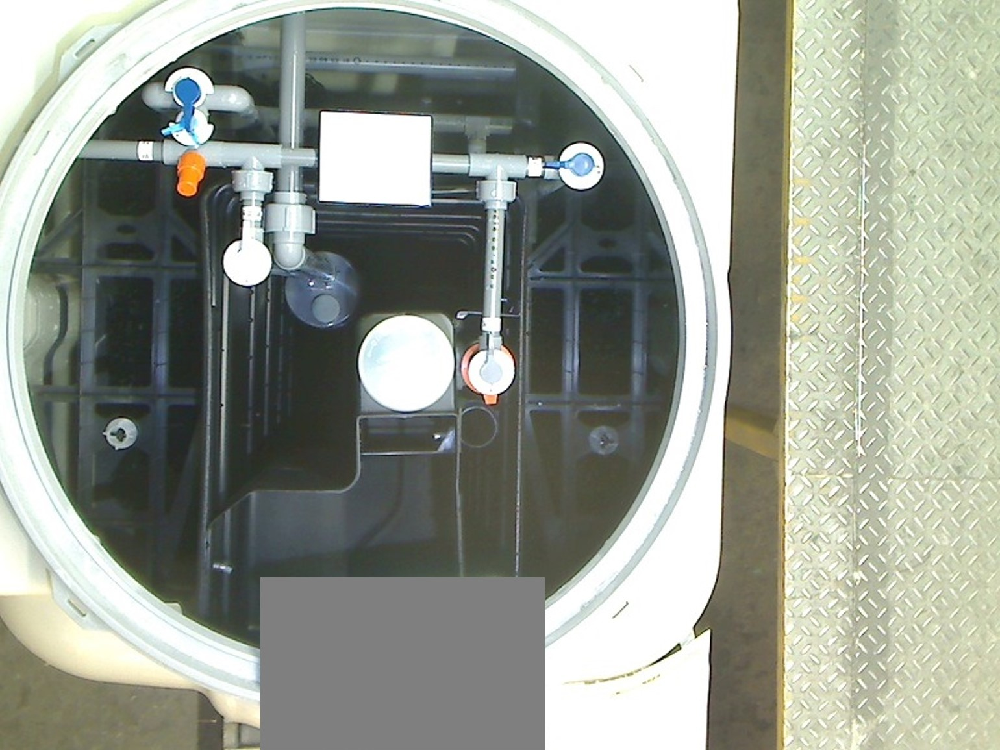


image 1/1 /content/gekkan-johkaso-2411/img/JO-7-3.jpg: 480x640 (no detections), 266.3ms
Speed: 7.9ms preprocess, 266.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed JO-7-3.jpg and saved to ./predict-images01/JO-7-3.jpg


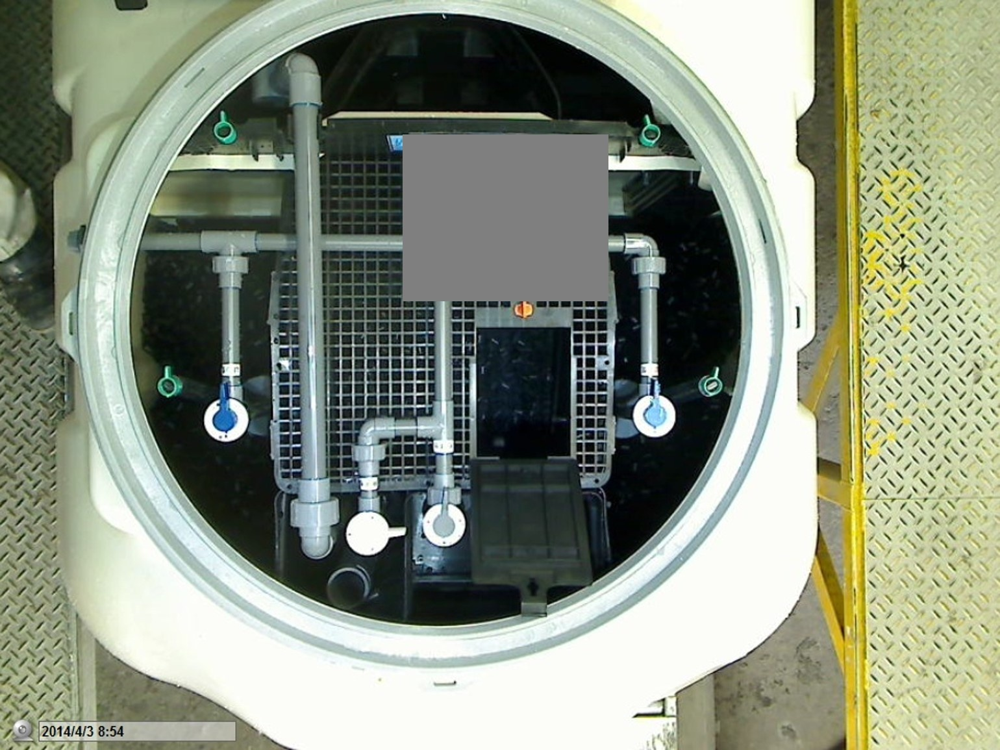


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-7-3.jpg: 480x640 (no detections), 262.4ms
Speed: 5.9ms preprocess, 262.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-7-3.jpg and saved to ./predict-images01/NEXT-7-3.jpg


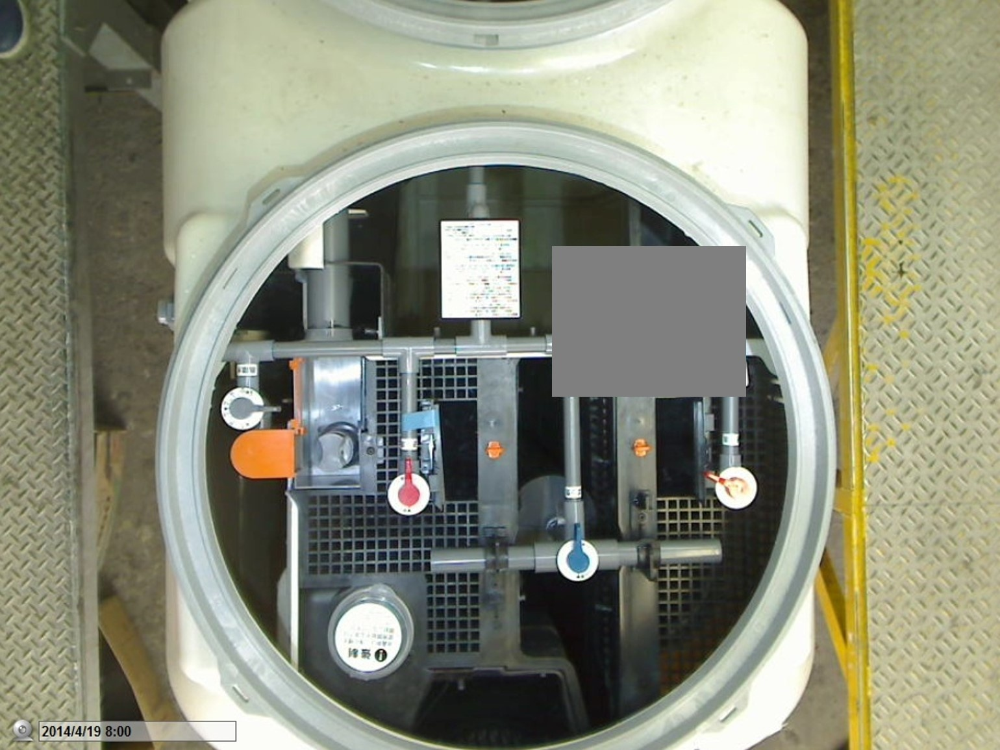


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-5-1.jpg: 480x640 (no detections), 274.8ms
Speed: 5.2ms preprocess, 274.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-5-1.jpg and saved to ./predict-images01/NEXT-5-1.jpg


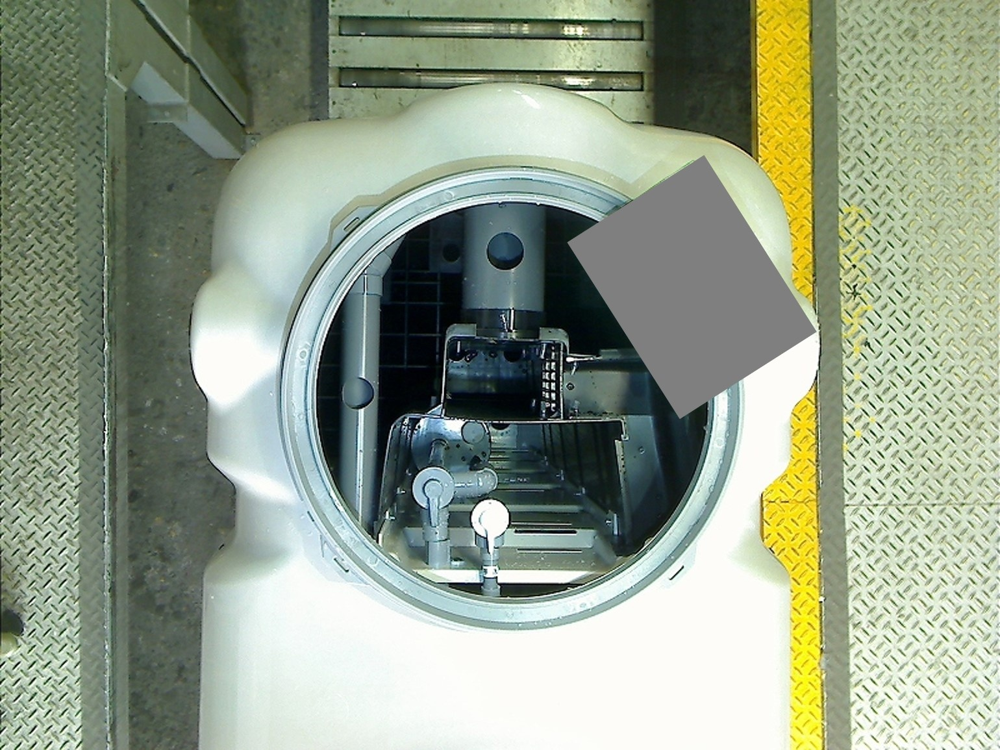

All predictions completed.


In [2]:
import os
from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display

# モデルのロード
model = YOLO('yolov8n.pt')

# 入力画像と出力フォルダのパス
input_dir = './img/'
output_dir = './predict-images01/'

# 出力フォルダが存在しない場合は作成
os.makedirs(output_dir, exist_ok=True)

# 入力フォルダ内の全ての画像を対象に予測を行う
for img_file in os.listdir(input_dir):
    if img_file.endswith(('.jpg', '.png', '.jpeg')):
        img_path = os.path.join(input_dir, img_file)

        # 画像を読み込んで予測を実行
        results = model(img_path)

        # 予測結果を保存
        for result in results:
            result_path = os.path.join(output_dir, img_file)
            result.save(result_path)
            print(f"Processed {img_file} and saved to {result_path}")
            display(Image(result_path))  # 画像を表示

print("All predictions completed.")


# ファインチューニングモデルの確認
アノテーションツールを使ってバルブ画像を学習したモデルで浄化槽バルブを検出できるか確認します。


image 1/1 /content/gekkan-johkaso-2411/img/JO-5-2.jpg: 480x640 2 valve-blues, 1 valve-grey, 1 valve-white, 273.9ms
Speed: 6.6ms preprocess, 273.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
Processed JO-5-2.jpg and saved to ./predict-images02/JO-5-2.jpg


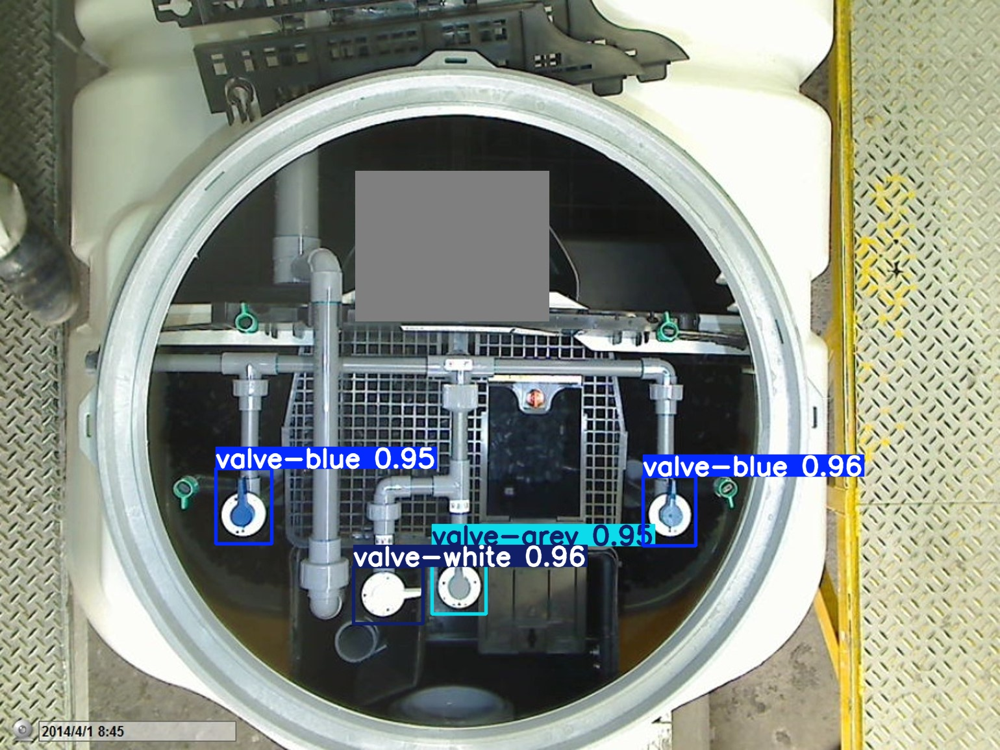


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-7-2.jpg: 480x640 1 valve-grey, 1 valve-three, 1 valve-white, 229.1ms
Speed: 5.1ms preprocess, 229.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-7-2.jpg and saved to ./predict-images02/NEXT-7-2.jpg


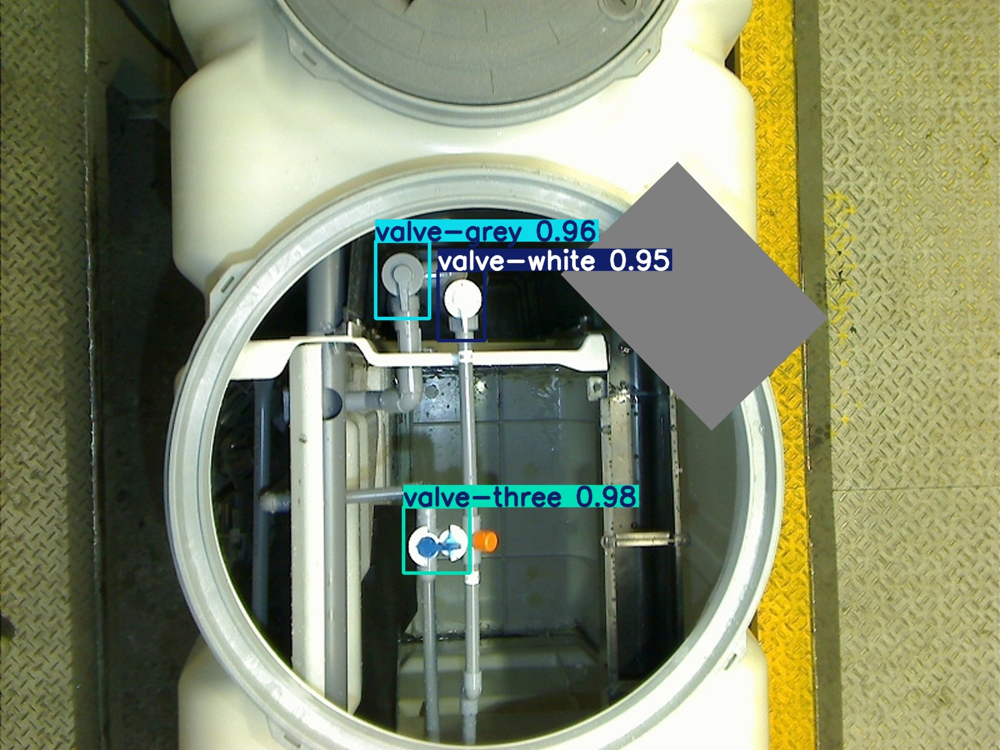


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-5-2.jpg: 480x640 1 valve-blue, 1 valve-grey, 2 valve-reds, 1 valve-three, 283.5ms
Speed: 5.3ms preprocess, 283.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-5-2.jpg and saved to ./predict-images02/NEXT-5-2.jpg


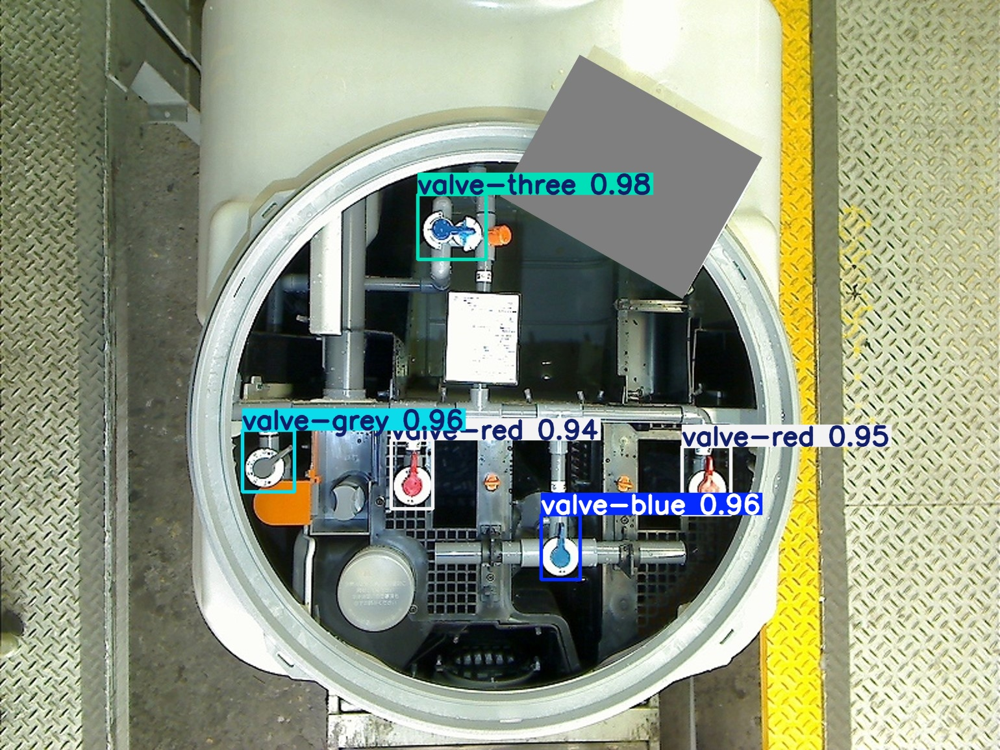


image 1/1 /content/gekkan-johkaso-2411/img/MO5-2.jpg: 480x640 1 valve-blue, 1 valve-grey, 2 valve-whites, 290.0ms
Speed: 5.2ms preprocess, 290.0ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed MO5-2.jpg and saved to ./predict-images02/MO5-2.jpg


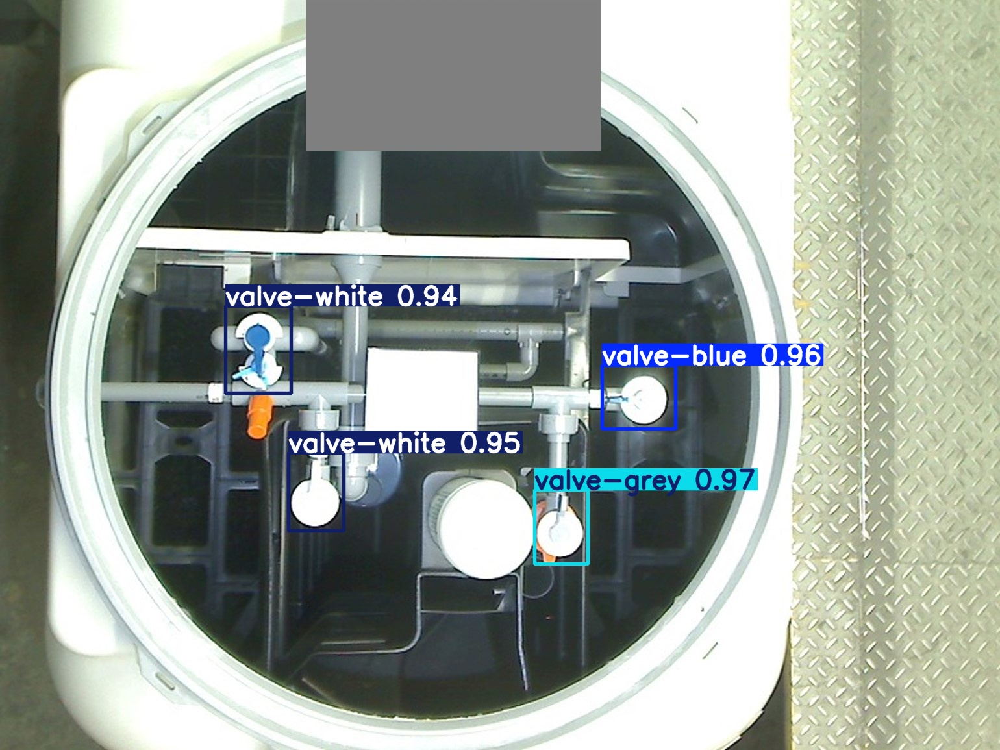


image 1/1 /content/gekkan-johkaso-2411/img/MO-7-3.jpg: 480x640 1 valve-blue, 1 valve-grey, 1 valve-three, 1 valve-white, 292.6ms
Speed: 6.8ms preprocess, 292.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed MO-7-3.jpg and saved to ./predict-images02/MO-7-3.jpg


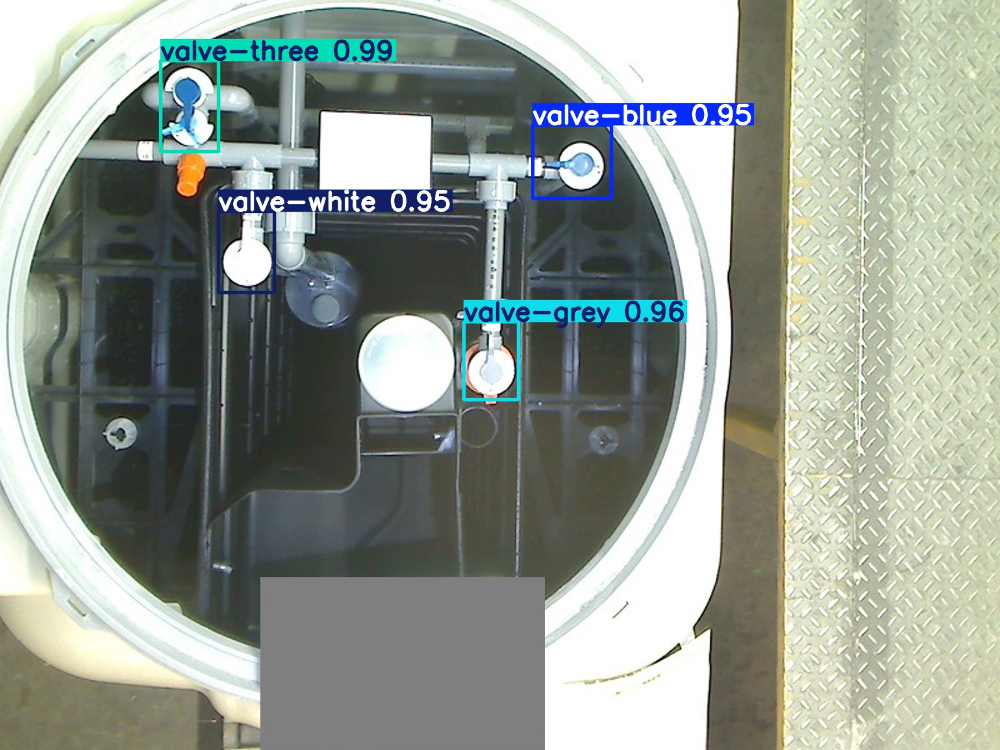


image 1/1 /content/gekkan-johkaso-2411/img/JO-7-3.jpg: 480x640 2 valve-blues, 1 valve-grey, 1 valve-white, 272.2ms
Speed: 5.3ms preprocess, 272.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed JO-7-3.jpg and saved to ./predict-images02/JO-7-3.jpg


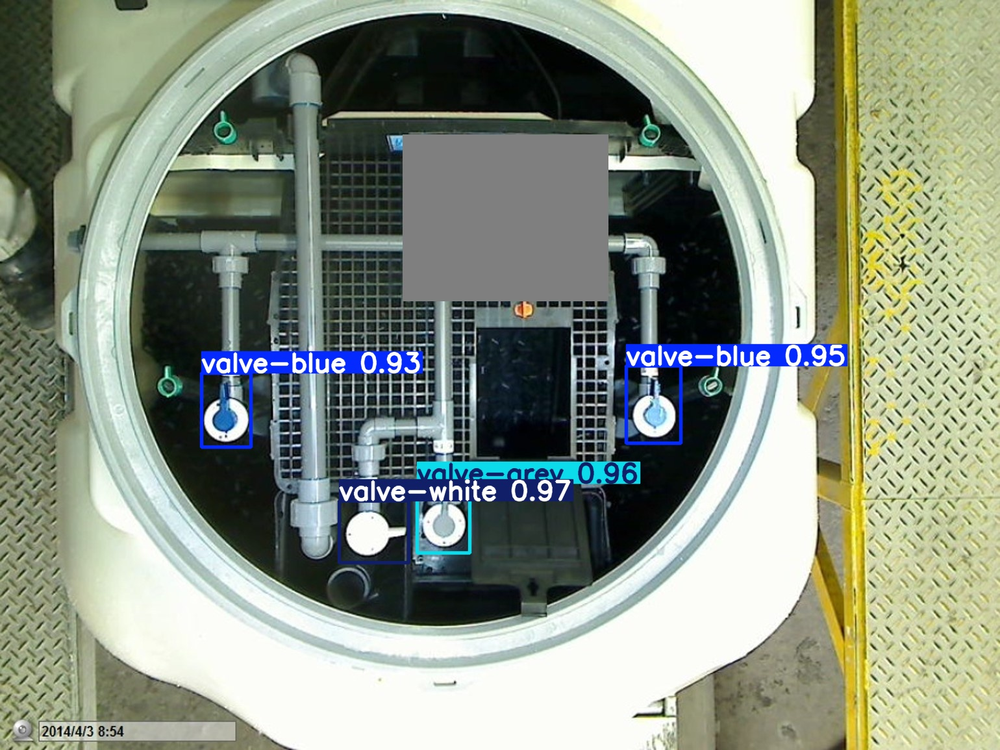


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-7-3.jpg: 480x640 1 valve-blue, 1 valve-grey, 2 valve-reds, 284.7ms
Speed: 5.0ms preprocess, 284.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-7-3.jpg and saved to ./predict-images02/NEXT-7-3.jpg


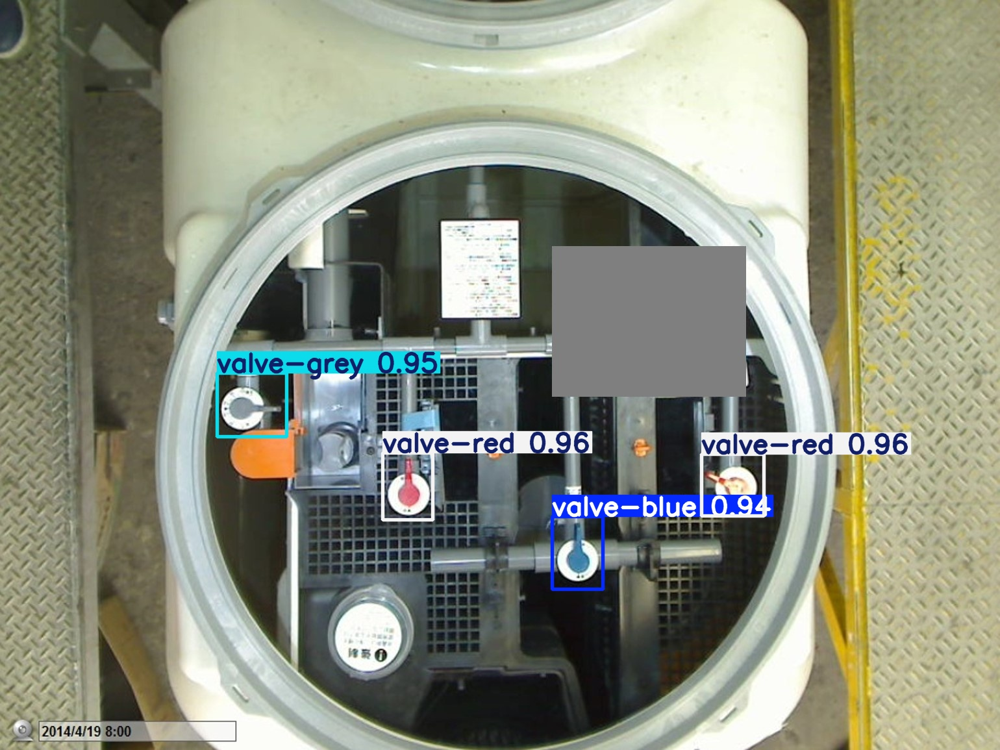


image 1/1 /content/gekkan-johkaso-2411/img/NEXT-5-1.jpg: 480x640 1 valve-grey, 1 valve-white, 274.3ms
Speed: 6.9ms preprocess, 274.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Processed NEXT-5-1.jpg and saved to ./predict-images02/NEXT-5-1.jpg


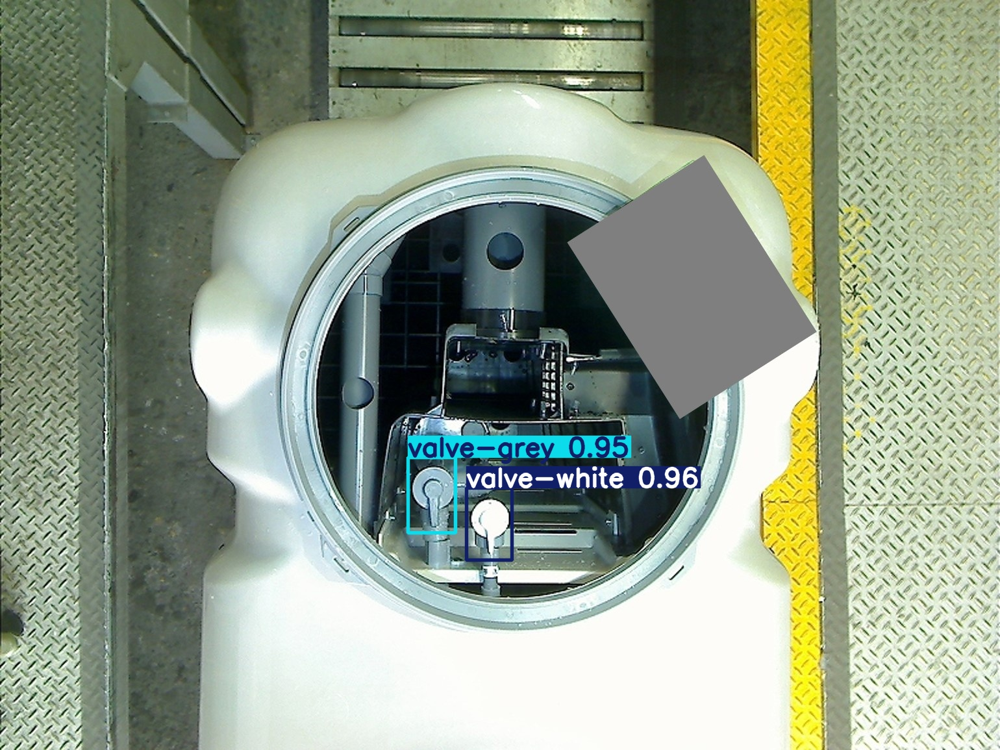

All predictions completed.


In [3]:
import os
from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display

# モデルのロード
model = YOLO('yolov8_finetuned_valve.pt')

# 入力画像と出力フォルダのパス
input_dir = './img/'
output_dir = './predict-images02/'

# 出力フォルダが存在しない場合は作成
os.makedirs(output_dir, exist_ok=True)

# 入力フォルダ内の全ての画像を対象に予測を行う
for img_file in os.listdir(input_dir):
    if img_file.endswith(('.jpg', '.png', '.jpeg')):
        img_path = os.path.join(input_dir, img_file)

        # 画像を読み込んで予測を実行
        results = model(img_path)

        # 予測結果を保存
        for result in results:
            result_path = os.path.join(output_dir, img_file)
            result.save(result_path)
            print(f"Processed {img_file} and saved to {result_path}")
            display(Image(result_path))  # 画像を表示

print("All predictions completed.")
